# End-to-end Multi-class Dog Breed Classification

This notebook bulids an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some info about the data:
* We're dealing with images (ustructured data) so its probably best we use deep learning and transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10.000+ images in the trining set (these have labels)
* There are aroung 10.000+ images in the test set (these have no labels, because we'll want to predict them).

In [2]:
#Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

### Get ourworkspace ready

* Import TensorFlow 2.XX
* Import TensorFlow Hub
* Make sure we're using a GPU

In [3]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print ("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check fpr GPU availibility
print("GPU", "availible (Yes!)" if tf.config.list_physical_devices("GPU") else "not availible")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU availible (Yes!)


 ## Getting our data ready (turning it into Tensors)

 With all ML models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

 Let's start by accessing our data and checking out the labels.

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


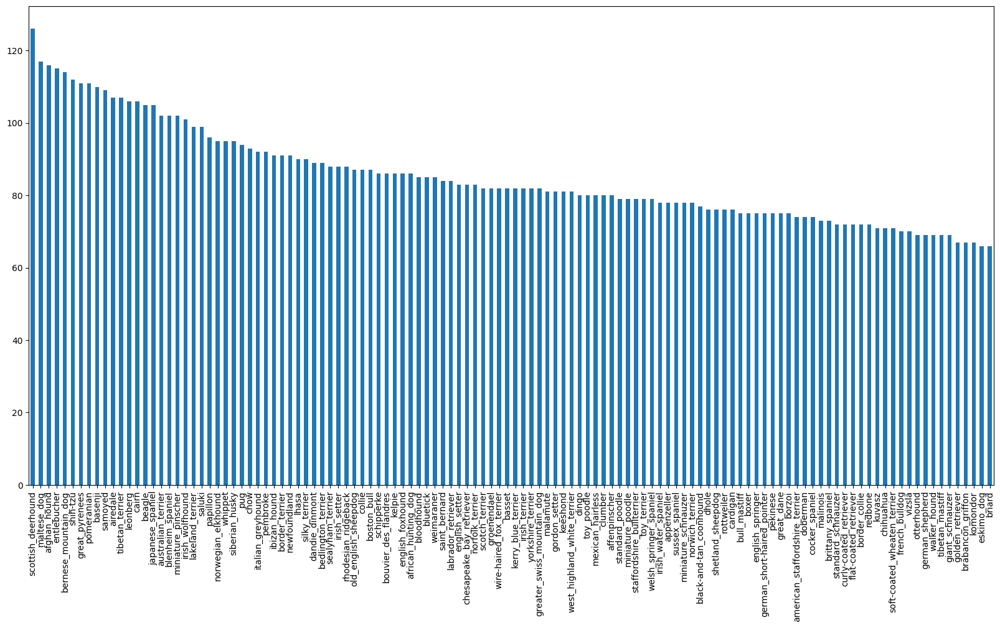

In [5]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [6]:
labels_csv["breed"].value_counts().median()

82.0

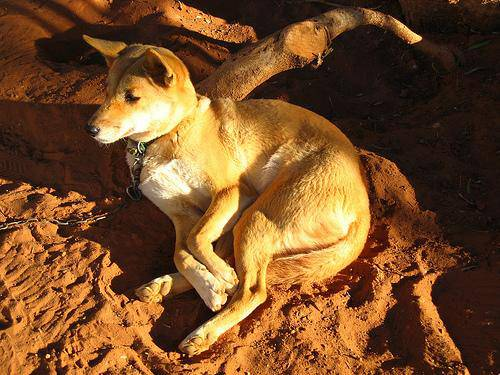

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathname from image ID's.
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!! Proceed.


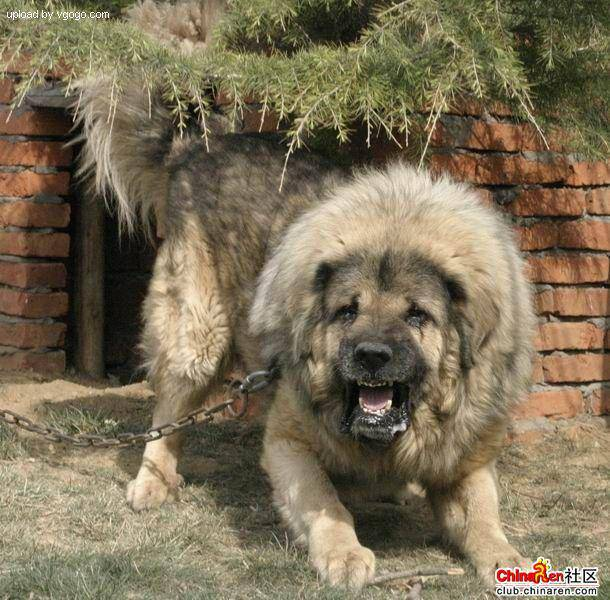

In [11]:
 # one more check
 Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filelpaths in a list, let's prepare our labels.

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into boolean arrays
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
# Example: turning boolean arrays into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occures in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [21]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [22]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [23]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [24]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [25]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (truning images into Tensors)

To preprocess our imgaes into Tensors we're going to write a function which does a few things:
1. Take an imgae filepath as input
2. Use a TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [26]:
# Convert an imgae to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [27]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an imgae filepath as input
2. Use a TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image`(convert color channel values from 0-255 to 0-1
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [28]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0 to 255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize th image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is batch size) images at a time (you can manually adjust the batch size if need be)

In order to use TensorFlow effecively, we need out data in the form of Tensor tuples which look like this:
`(image, label)`.

In [29]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, preprocess the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [30]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

##

Now we've got a way to turn our data into tuples of Tensors in the form:
`(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [31]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles th data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as inputs (no labels)
  """
  # If the data is a test dataset, we don't have labels
  if test_data:
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) # filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (thsi also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [32]:
# Creating trining and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [33]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them

In [34]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display as image
    plt.imshow(images[i])
    # Add tha image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")

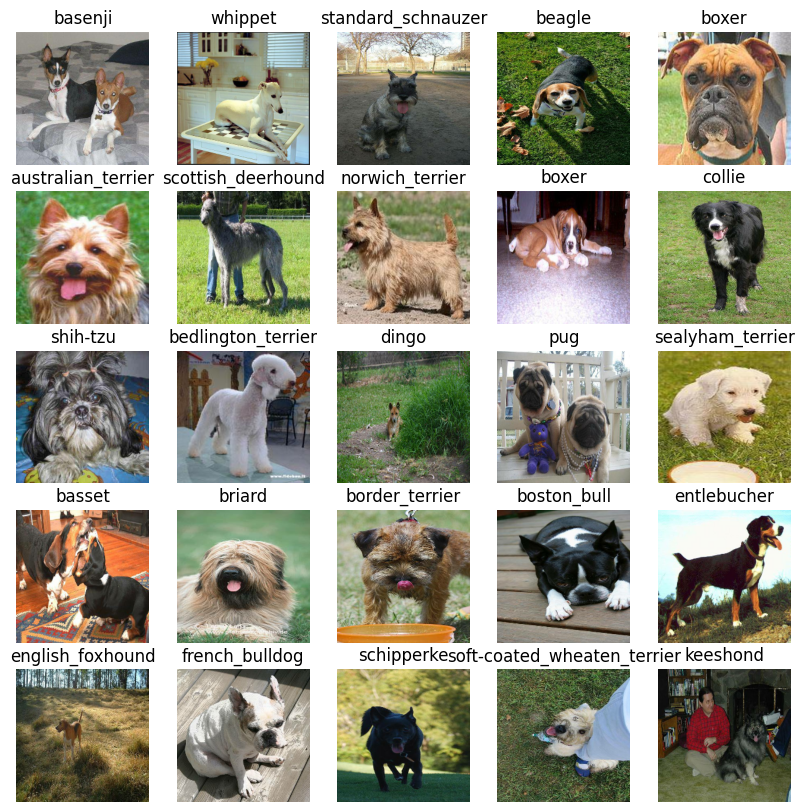

In [35]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

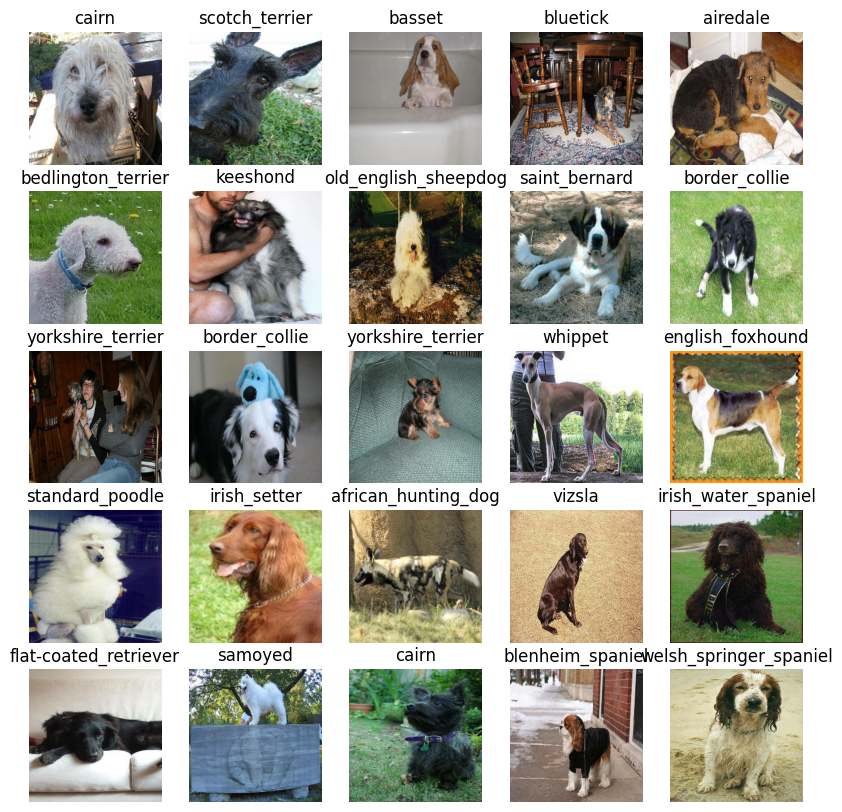

In [36]:
# Now let's visualize pur validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Buliding a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from Tensorflow hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [37]:
 # Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup the output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've go tour inputs, outputs and model ready to go.
Let's put them together into a Keras Deep Learning model!

íknowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Complies the model (says how it should be avaluated and improved)
* Build the model ( tells the model the input shape it'll be getting)
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [38]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile a model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["Accuracy"]

  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [39]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helpful functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [40]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [41]:
import datetime

# Create a function to create a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://keras.io/api/callbacks/early_stopping/

In [42]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

 ## Training a model (on subset of data)

 Our first model is only going to train on 1000 images to make sure everything is working

In [43]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [44]:
# Check to make sure we're still running ona GPU.
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function that creates a model.

* Create a model using `create model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return model

In [45]:
# Bulid a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return fitted model
  return model

In [46]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - ETA: 0s - loss: 4.5704 - Accuracy: 0.0988

25/25 [==============================] - 117s 3s/step - loss: 4.5704 - Accuracy: 0.0988 - val_loss: 3.3373 - val_Accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - ETA: 0s - loss: 1.6542 - Accuracy: 0.6850

25/25 [==============================] - 3s 140ms/step - loss: 1.6542 - Accuracy: 0.6850 - val_loss: 2.0530 - val_Accuracy: 0.5450
Epoch 3/100
25/25 [==============================] - ETA: 0s - loss: 0.5756 - Accuracy: 0.9325

25/25 [==============================] - 5s 194ms/step - loss: 0.5756 - Accuracy: 0.9325 - val_loss: 1.6058 - val_Accuracy: 0.6500
Epoch 4/100
25/25 [==============================] - ETA: 0s - loss: 0.2608 - Accuracy: 0.9837

25/25 [==============================] - 3s 138ms/step - loss: 0.2608 - Accuracy: 0.9837 - val_loss: 1.4097 - val_Accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - ETA: 0s - loss: 0.1504 - Accuracy: 0.9937

25/25 [==============================] - 4s 140ms/step - loss: 0.1504 - Accuracy: 0.9937 - val_loss: 1.3392 - val_Accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - ETA: 0s - loss: 0.1024 - Accuracy: 0.9987

25/25 [==============================] - 5s 211ms/step - loss: 0.1024 - Accuracy: 0.9987 - val_loss: 1.2930 - val_Accuracy: 0.6700
Epoch 7/100
25/25 [==============================] - ETA: 0s - loss: 0.0764 - Accuracy: 1.0000

25/25 [==============================] - 4s 144ms/step - loss: 0.0764 - Accuracy: 1.0000 - val_loss: 1.2567 - val_Accuracy: 0.6850
Epoch 8/100
25/25 [==============================] - ETA: 0s - loss: 0.0602 - Accuracy: 1.0000

25/25 [==============================] - 4s 164ms/step - loss: 0.0602 - Accuracy: 1.0000 - val_loss: 1.2336 - val_Accuracy: 0.6900
Epoch 9/100
25/25 [==============================] - ETA: 0s - loss: 0.0494 - Accuracy: 1.0000

25/25 [==============================] - 4s 176ms/step - loss: 0.0494 - Accuracy: 1.0000 - val_loss: 1.2198 - val_Accuracy: 0.7000
Epoch 10/100
25/25 [==============================] - ETA: 0s - loss: 0.0417 - Accuracy: 1.0000

25/25 [==============================] - 4s 143ms/step - loss: 0.0417 - Accuracy: 1.0000 - val_loss: 1.2003 - val_Accuracy: 0.6950
Epoch 11/100
25/25 [==============================] - ETA: 0s - loss: 0.0358 - Accuracy: 1.0000

25/25 [==============================] - 4s 156ms/step - loss: 0.0358 - Accuracy: 1.0000 - val_loss: 1.1873 - val_Accuracy: 0.6950
Epoch 12/100
25/25 [==============================] - ETA: 0s - loss: 0.0311 - Accuracy: 1.0000

25/25 [==============================] - 4s 146ms/step - loss: 0.0311 - Accuracy: 1.0000 - val_loss: 1.1798 - val_Accuracy: 0.6950
Epoch 13/100
25/25 [==============================] - ETA: 0s - loss: 0.0276 - Accuracy: 1.0000

25/25 [==============================] - 4s 145ms/step - loss: 0.0276 - Accuracy: 1.0000 - val_loss: 1.1678 - val_Accuracy: 0.7000
Epoch 14/100
25/25 [==============================] - ETA: 0s - loss: 0.0245 - Accuracy: 1.0000

25/25 [==============================] - 5s 184ms/step - loss: 0.0245 - Accuracy: 1.0000 - val_loss: 1.1592 - val_Accuracy: 0.7000
Epoch 15/100
25/25 [==============================] - ETA: 0s - loss: 0.0221 - Accuracy: 1.0000

25/25 [==============================] - 4s 143ms/step - loss: 0.0221 - Accuracy: 1.0000 - val_loss: 1.1557 - val_Accuracy: 0.7050
Epoch 16/100
25/25 [==============================] - ETA: 0s - loss: 0.0200 - Accuracy: 1.0000

25/25 [==============================] - 4s 142ms/step - loss: 0.0200 - Accuracy: 1.0000 - val_loss: 1.1500 - val_Accuracy: 0.7000
Epoch 17/100
25/25 [==============================] - ETA: 0s - loss: 0.0182 - Accuracy: 1.0000

25/25 [==============================] - 5s 189ms/step - loss: 0.0182 - Accuracy: 1.0000 - val_loss: 1.1449 - val_Accuracy: 0.7000
Epoch 18/100
25/25 [==============================] - ETA: 0s - loss: 0.0166 - Accuracy: 1.0000

25/25 [==============================] - 4s 174ms/step - loss: 0.0166 - Accuracy: 1.0000 - val_loss: 1.1396 - val_Accuracy: 0.7000
Epoch 19/100
25/25 [==============================] - ETA: 0s - loss: 0.0153 - Accuracy: 1.0000

25/25 [==============================] - 4s 166ms/step - loss: 0.0153 - Accuracy: 1.0000 - val_loss: 1.1364 - val_Accuracy: 0.6950
Epoch 20/100
25/25 [==============================] - ETA: 0s - loss: 0.0141 - Accuracy: 1.0000

25/25 [==============================] - 5s 186ms/step - loss: 0.0141 - Accuracy: 1.0000 - val_loss: 1.1330 - val_Accuracy: 0.7000
Epoch 21/100
25/25 [==============================] - ETA: 0s - loss: 0.0131 - Accuracy: 1.0000

25/25 [==============================] - 4s 164ms/step - loss: 0.0131 - Accuracy: 1.0000 - val_loss: 1.1282 - val_Accuracy: 0.7050
Epoch 22/100
25/25 [==============================] - ETA: 0s - loss: 0.0122 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0122 - Accuracy: 1.0000 - val_loss: 1.1254 - val_Accuracy: 0.7050
Epoch 23/100
25/25 [==============================] - ETA: 0s - loss: 0.0114 - Accuracy: 1.0000

25/25 [==============================] - 5s 185ms/step - loss: 0.0114 - Accuracy: 1.0000 - val_loss: 1.1220 - val_Accuracy: 0.7050
Epoch 24/100
25/25 [==============================] - ETA: 0s - loss: 0.0107 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0107 - Accuracy: 1.0000 - val_loss: 1.1210 - val_Accuracy: 0.7000
Epoch 25/100
25/25 [==============================] - ETA: 0s - loss: 0.0100 - Accuracy: 1.0000

25/25 [==============================] - 4s 152ms/step - loss: 0.0100 - Accuracy: 1.0000 - val_loss: 1.1189 - val_Accuracy: 0.7100
Epoch 26/100
25/25 [==============================] - ETA: 0s - loss: 0.0094 - Accuracy: 1.0000

25/25 [==============================] - 4s 142ms/step - loss: 0.0094 - Accuracy: 1.0000 - val_loss: 1.1171 - val_Accuracy: 0.7100
Epoch 27/100
25/25 [==============================] - ETA: 0s - loss: 0.0089 - Accuracy: 1.0000

25/25 [==============================] - 4s 141ms/step - loss: 0.0089 - Accuracy: 1.0000 - val_loss: 1.1146 - val_Accuracy: 0.7050
Epoch 28/100
25/25 [==============================] - ETA: 0s - loss: 0.0084 - Accuracy: 1.0000

25/25 [==============================] - 4s 153ms/step - loss: 0.0084 - Accuracy: 1.0000 - val_loss: 1.1130 - val_Accuracy: 0.7100
Epoch 29/100
25/25 [==============================] - ETA: 0s - loss: 0.0079 - Accuracy: 1.0000

25/25 [==============================] - 4s 174ms/step - loss: 0.0079 - Accuracy: 1.0000 - val_loss: 1.1109 - val_Accuracy: 0.6950
Epoch 30/100
25/25 [==============================] - ETA: 0s - loss: 0.0075 - Accuracy: 1.0000

25/25 [==============================] - 4s 143ms/step - loss: 0.0075 - Accuracy: 1.0000 - val_loss: 1.1109 - val_Accuracy: 0.7100
Epoch 31/100
25/25 [==============================] - ETA: 0s - loss: 0.0071 - Accuracy: 1.0000

25/25 [==============================] - 4s 166ms/step - loss: 0.0071 - Accuracy: 1.0000 - val_loss: 1.1076 - val_Accuracy: 0.7000
Epoch 32/100
25/25 [==============================] - ETA: 0s - loss: 0.0068 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0068 - Accuracy: 1.0000 - val_loss: 1.1077 - val_Accuracy: 0.7000
Epoch 33/100
25/25 [==============================] - ETA: 0s - loss: 0.0065 - Accuracy: 1.0000

25/25 [==============================] - 4s 145ms/step - loss: 0.0065 - Accuracy: 1.0000 - val_loss: 1.1061 - val_Accuracy: 0.7050
Epoch 34/100
25/25 [==============================] - ETA: 0s - loss: 0.0062 - Accuracy: 1.0000

25/25 [==============================] - 4s 145ms/step - loss: 0.0062 - Accuracy: 1.0000 - val_loss: 1.1052 - val_Accuracy: 0.7100
Epoch 35/100
25/25 [==============================] - ETA: 0s - loss: 0.0059 - Accuracy: 1.0000

25/25 [==============================] - 4s 165ms/step - loss: 0.0059 - Accuracy: 1.0000 - val_loss: 1.1044 - val_Accuracy: 0.7000
Epoch 36/100
25/25 [==============================] - ETA: 0s - loss: 0.0056 - Accuracy: 1.0000

25/25 [==============================] - 4s 164ms/step - loss: 0.0056 - Accuracy: 1.0000 - val_loss: 1.1035 - val_Accuracy: 0.7000
Epoch 37/100
25/25 [==============================] - ETA: 0s - loss: 0.0054 - Accuracy: 1.0000

25/25 [==============================] - 4s 170ms/step - loss: 0.0054 - Accuracy: 1.0000 - val_loss: 1.1030 - val_Accuracy: 0.7000
Epoch 38/100
25/25 [==============================] - ETA: 0s - loss: 0.0052 - Accuracy: 1.0000

25/25 [==============================] - 4s 176ms/step - loss: 0.0052 - Accuracy: 1.0000 - val_loss: 1.1016 - val_Accuracy: 0.7000
Epoch 39/100
25/25 [==============================] - ETA: 0s - loss: 0.0049 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0049 - Accuracy: 1.0000 - val_loss: 1.1011 - val_Accuracy: 0.7000
Epoch 40/100
25/25 [==============================] - ETA: 0s - loss: 0.0047 - Accuracy: 1.0000

25/25 [==============================] - 5s 185ms/step - loss: 0.0047 - Accuracy: 1.0000 - val_loss: 1.1015 - val_Accuracy: 0.7000
Epoch 41/100
25/25 [==============================] - ETA: 0s - loss: 0.0046 - Accuracy: 1.0000

25/25 [==============================] - 4s 146ms/step - loss: 0.0046 - Accuracy: 1.0000 - val_loss: 1.1001 - val_Accuracy: 0.7000
Epoch 42/100
25/25 [==============================] - ETA: 0s - loss: 0.0044 - Accuracy: 1.0000

25/25 [==============================] - 4s 144ms/step - loss: 0.0044 - Accuracy: 1.0000 - val_loss: 1.0992 - val_Accuracy: 0.7000
Epoch 43/100
25/25 [==============================] - ETA: 0s - loss: 0.0042 - Accuracy: 1.0000

25/25 [==============================] - 5s 204ms/step - loss: 0.0042 - Accuracy: 1.0000 - val_loss: 1.0994 - val_Accuracy: 0.7000
Epoch 44/100
25/25 [==============================] - ETA: 0s - loss: 0.0041 - Accuracy: 1.0000

25/25 [==============================] - 4s 146ms/step - loss: 0.0041 - Accuracy: 1.0000 - val_loss: 1.0982 - val_Accuracy: 0.7000
Epoch 45/100
25/25 [==============================] - ETA: 0s - loss: 0.0039 - Accuracy: 1.0000

25/25 [==============================] - 4s 149ms/step - loss: 0.0039 - Accuracy: 1.0000 - val_loss: 1.0978 - val_Accuracy: 0.7000
Epoch 46/100
25/25 [==============================] - ETA: 0s - loss: 0.0038 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0038 - Accuracy: 1.0000 - val_loss: 1.0979 - val_Accuracy: 0.7050
Epoch 47/100
25/25 [==============================] - ETA: 0s - loss: 0.0036 - Accuracy: 1.0000

25/25 [==============================] - 4s 145ms/step - loss: 0.0036 - Accuracy: 1.0000 - val_loss: 1.0986 - val_Accuracy: 0.7050
Epoch 48/100
25/25 [==============================] - ETA: 0s - loss: 0.0035 - Accuracy: 1.0000

25/25 [==============================] - 5s 187ms/step - loss: 0.0035 - Accuracy: 1.0000 - val_loss: 1.0981 - val_Accuracy: 0.7050
Epoch 49/100
25/25 [==============================] - ETA: 0s - loss: 0.0034 - Accuracy: 1.0000

25/25 [==============================] - 4s 167ms/step - loss: 0.0034 - Accuracy: 1.0000 - val_loss: 1.0963 - val_Accuracy: 0.7050
Epoch 50/100
25/25 [==============================] - ETA: 0s - loss: 0.0033 - Accuracy: 1.0000

25/25 [==============================] - 4s 150ms/step - loss: 0.0033 - Accuracy: 1.0000 - val_loss: 1.0968 - val_Accuracy: 0.7050
Epoch 51/100
25/25 [==============================] - ETA: 0s - loss: 0.0032 - Accuracy: 1.0000

25/25 [==============================] - 5s 203ms/step - loss: 0.0032 - Accuracy: 1.0000 - val_loss: 1.0964 - val_Accuracy: 0.7050
Epoch 52/100
25/25 [==============================] - ETA: 0s - loss: 0.0031 - Accuracy: 1.0000

25/25 [==============================] - 4s 155ms/step - loss: 0.0031 - Accuracy: 1.0000 - val_loss: 1.0972 - val_Accuracy: 0.7050
Epoch 53/100
25/25 [==============================] - ETA: 0s - loss: 0.0030 - Accuracy: 1.0000

25/25 [==============================] - 5s 210ms/step - loss: 0.0030 - Accuracy: 1.0000 - val_loss: 1.0965 - val_Accuracy: 0.7050
Epoch 54/100
25/25 [==============================] - ETA: 0s - loss: 0.0029 - Accuracy: 1.0000

25/25 [==============================] - 5s 189ms/step - loss: 0.0029 - Accuracy: 1.0000 - val_loss: 1.0970 - val_Accuracy: 0.7050
Epoch 55/100
25/25 [==============================] - ETA: 0s - loss: 0.0028 - Accuracy: 1.0000

25/25 [==============================] - 4s 165ms/step - loss: 0.0028 - Accuracy: 1.0000 - val_loss: 1.0962 - val_Accuracy: 0.7050
Epoch 56/100
25/25 [==============================] - ETA: 0s - loss: 0.0027 - Accuracy: 1.0000

25/25 [==============================] - 4s 168ms/step - loss: 0.0027 - Accuracy: 1.0000 - val_loss: 1.0958 - val_Accuracy: 0.7050
Epoch 57/100
25/25 [==============================] - ETA: 0s - loss: 0.0026 - Accuracy: 1.0000

25/25 [==============================] - 4s 143ms/step - loss: 0.0026 - Accuracy: 1.0000 - val_loss: 1.0959 - val_Accuracy: 0.7050
Epoch 58/100
25/25 [==============================] - ETA: 0s - loss: 0.0026 - Accuracy: 1.0000

25/25 [==============================] - 4s 166ms/step - loss: 0.0026 - Accuracy: 1.0000 - val_loss: 1.0964 - val_Accuracy: 0.7050
Epoch 59/100
25/25 [==============================] - ETA: 0s - loss: 0.0025 - Accuracy: 1.0000

25/25 [==============================] - 5s 208ms/step - loss: 0.0025 - Accuracy: 1.0000 - val_loss: 1.0955 - val_Accuracy: 0.7050
Epoch 60/100
25/25 [==============================] - ETA: 0s - loss: 0.0024 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0024 - Accuracy: 1.0000 - val_loss: 1.0955 - val_Accuracy: 0.7050
Epoch 61/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - Accuracy: 1.0000

25/25 [==============================] - 4s 147ms/step - loss: 0.0023 - Accuracy: 1.0000 - val_loss: 1.0963 - val_Accuracy: 0.7050
Epoch 62/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - Accuracy: 1.0000

25/25 [==============================] - 5s 208ms/step - loss: 0.0023 - Accuracy: 1.0000 - val_loss: 1.0960 - val_Accuracy: 0.7050
Epoch 63/100
25/25 [==============================] - ETA: 0s - loss: 0.0022 - Accuracy: 1.0000

25/25 [==============================] - 4s 148ms/step - loss: 0.0022 - Accuracy: 1.0000 - val_loss: 1.0962 - val_Accuracy: 0.7050
Epoch 64/100
25/25 [==============================] - ETA: 0s - loss: 0.0022 - Accuracy: 1.0000

25/25 [==============================] - 4s 146ms/step - loss: 0.0022 - Accuracy: 1.0000 - val_loss: 1.0960 - val_Accuracy: 0.7050
Epoch 65/100
25/25 [==============================] - ETA: 0s - loss: 0.0021 - Accuracy: 1.0000

25/25 [==============================] - 5s 206ms/step - loss: 0.0021 - Accuracy: 1.0000 - val_loss: 1.0960 - val_Accuracy: 0.7050
Epoch 66/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - Accuracy: 1.0000

25/25 [==============================] - 4s 165ms/step - loss: 0.0020 - Accuracy: 1.0000 - val_loss: 1.0968 - val_Accuracy: 0.7050
Epoch 67/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - Accuracy: 1.0000

25/25 [==============================] - 4s 145ms/step - loss: 0.0020 - Accuracy: 1.0000 - val_loss: 1.0964 - val_Accuracy: 0.7050
Epoch 68/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - Accuracy: 1.0000

25/25 [==============================] - 4s 153ms/step - loss: 0.0019 - Accuracy: 1.0000 - val_loss: 1.0960 - val_Accuracy: 0.7050
Epoch 69/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - Accuracy: 1.0000

25/25 [==============================] - 4s 144ms/step - loss: 0.0019 - Accuracy: 1.0000 - val_loss: 1.0959 - val_Accuracy: 0.7050
Epoch 70/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - Accuracy: 1.0000

25/25 [==============================] - 4s 167ms/step - loss: 0.0018 - Accuracy: 1.0000 - val_loss: 1.0961 - val_Accuracy: 0.7100
Epoch 71/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0018 - Accuracy: 1.0000 - val_loss: 1.0967 - val_Accuracy: 0.7100
Epoch 72/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - Accuracy: 1.0000

25/25 [==============================] - 4s 148ms/step - loss: 0.0018 - Accuracy: 1.0000 - val_loss: 1.0968 - val_Accuracy: 0.7150
Epoch 73/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - Accuracy: 1.0000

25/25 [==============================] - 5s 188ms/step - loss: 0.0017 - Accuracy: 1.0000 - val_loss: 1.0972 - val_Accuracy: 0.7150
Epoch 74/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - Accuracy: 1.0000

25/25 [==============================] - 4s 164ms/step - loss: 0.0017 - Accuracy: 1.0000 - val_loss: 1.0968 - val_Accuracy: 0.7150
Epoch 75/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - Accuracy: 1.0000

25/25 [==============================] - 4s 143ms/step - loss: 0.0016 - Accuracy: 1.0000 - val_loss: 1.0971 - val_Accuracy: 0.7150
Epoch 76/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - Accuracy: 1.0000

25/25 [==============================] - 5s 183ms/step - loss: 0.0016 - Accuracy: 1.0000 - val_loss: 1.0978 - val_Accuracy: 0.7150
Epoch 77/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - Accuracy: 1.0000

25/25 [==============================] - 4s 172ms/step - loss: 0.0016 - Accuracy: 1.0000 - val_loss: 1.0973 - val_Accuracy: 0.7150
Epoch 78/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - Accuracy: 1.0000

25/25 [==============================] - 4s 151ms/step - loss: 0.0015 - Accuracy: 1.0000 - val_loss: 1.0978 - val_Accuracy: 0.7150
Epoch 79/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - Accuracy: 1.0000

25/25 [==============================] - 5s 185ms/step - loss: 0.0015 - Accuracy: 1.0000 - val_loss: 1.0983 - val_Accuracy: 0.7150
Epoch 80/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - Accuracy: 1.0000

25/25 [==============================] - 4s 176ms/step - loss: 0.0014 - Accuracy: 1.0000 - val_loss: 1.0978 - val_Accuracy: 0.7150
Epoch 81/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0014 - Accuracy: 1.0000 - val_loss: 1.0984 - val_Accuracy: 0.7150
Epoch 82/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - Accuracy: 1.0000

25/25 [==============================] - 5s 202ms/step - loss: 0.0014 - Accuracy: 1.0000 - val_loss: 1.0989 - val_Accuracy: 0.7150
Epoch 83/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - Accuracy: 1.0000

25/25 [==============================] - 4s 168ms/step - loss: 0.0014 - Accuracy: 1.0000 - val_loss: 1.0991 - val_Accuracy: 0.7150
Epoch 84/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - Accuracy: 1.0000

25/25 [==============================] - 4s 145ms/step - loss: 0.0013 - Accuracy: 1.0000 - val_loss: 1.0991 - val_Accuracy: 0.7150
Epoch 85/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - Accuracy: 1.0000

25/25 [==============================] - 5s 194ms/step - loss: 0.0013 - Accuracy: 1.0000 - val_loss: 1.0995 - val_Accuracy: 0.7150
Epoch 86/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - Accuracy: 1.0000

25/25 [==============================] - 4s 148ms/step - loss: 0.0013 - Accuracy: 1.0000 - val_loss: 1.0997 - val_Accuracy: 0.7150
Epoch 87/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 4s 146ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.1000 - val_Accuracy: 0.7150
Epoch 88/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 4s 172ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.0999 - val_Accuracy: 0.7150
Epoch 89/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 4s 167ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.1002 - val_Accuracy: 0.7150
Epoch 90/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 4s 167ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.1008 - val_Accuracy: 0.7150
Epoch 91/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 5s 179ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.1013 - val_Accuracy: 0.7150
Epoch 92/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 4s 168ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.1014 - val_Accuracy: 0.7150
Epoch 93/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 4s 166ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.1012 - val_Accuracy: 0.7150
Epoch 94/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 4s 160ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.1019 - val_Accuracy: 0.7150
Epoch 95/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - Accuracy: 1.0000

25/25 [==============================] - 3s 140ms/step - loss: 0.0010 - Accuracy: 1.0000 - val_loss: 1.1020 - val_Accuracy: 0.7150
Epoch 96/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - Accuracy: 1.0000

25/25 [==============================] - 5s 183ms/step - loss: 0.0010 - Accuracy: 1.0000 - val_loss: 1.1020 - val_Accuracy: 0.7150
Epoch 97/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - Accuracy: 1.0000

25/25 [==============================] - 5s 183ms/step - loss: 0.0010 - Accuracy: 1.0000 - val_loss: 1.1030 - val_Accuracy: 0.7150
Epoch 98/100
25/25 [==============================] - ETA: 0s - loss: 9.8675e-04 - Accuracy: 1.0000

25/25 [==============================] - 4s 146ms/step - loss: 9.8675e-04 - Accuracy: 1.0000 - val_loss: 1.1026 - val_Accuracy: 0.7150
Epoch 99/100
25/25 [==============================] - ETA: 0s - loss: 9.6704e-04 - Accuracy: 1.0000

25/25 [==============================] - 5s 207ms/step - loss: 9.6704e-04 - Accuracy: 1.0000 - val_loss: 1.1035 - val_Accuracy: 0.7150
Epoch 100/100
25/25 [==============================] - ETA: 0s - loss: 9.4773e-04 - Accuracy: 1.0000

25/25 [==============================] - 4s 157ms/step - loss: 9.4773e-04 - Accuracy: 1.0000 - val_loss: 1.1041 - val_Accuracy: 0.7150


**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [47]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using trained model

In [48]:
# Make predictions on the validation data ( not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 178ms/step


array([[8.5769093e-04, 2.0184649e-05, 8.2351587e-05, ..., 1.3257776e-04,
        3.4448940e-06, 1.0111240e-03],
       [4.3220737e-04, 7.6553028e-05, 2.9679423e-03, ..., 3.1030289e-05,
        7.8677299e-04, 1.1913955e-05],
       [1.3273620e-06, 1.0734539e-05, 1.3338465e-06, ..., 1.7492612e-06,
        1.9185566e-06, 2.7527906e-06],
       ...,
       [3.0449144e-08, 3.2343573e-07, 1.3366846e-06, ..., 8.9721119e-08,
        1.6510435e-06, 5.7223650e-07],
       [8.9071714e-04, 2.1976000e-05, 2.4285624e-05, ..., 2.1314965e-05,
        1.9157874e-06, 5.0566690e-03],
       [5.0221355e-05, 1.5784293e-05, 6.4593024e-04, ..., 1.3965816e-03,
        1.9226638e-04, 7.4890163e-06]], dtype=float32)

In [49]:
np.sum(predictions[0])

1.0

In [50]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.29705168e-05 7.04307513e-06 3.58150487e-06 8.54441987e-06
 2.19998547e-04 1.76410856e-06 1.92267435e-05 1.27037696e-04
 2.49057915e-03 5.45667903e-03 1.42825775e-06 2.94045446e-08
 7.17544681e-05 4.64719807e-04 2.45939118e-05 2.90214375e-04
 6.42422435e-07 3.84671839e-05 3.30001899e-06 1.51482427e-05
 2.14035367e-07 3.58940888e-05 1.52569946e-05 3.64125640e-07
 3.92482243e-03 6.23211145e-06 3.66073232e-06 5.44864679e-06
 1.79361705e-05 8.21652804e-07 1.39820781e-06 2.87019498e-06
 6.23242954e-07 1.80129223e-06 1.34122240e-06 8.91661728e-07
 1.45751492e-05 5.52904885e-06 1.52875589e-06 1.45406634e-01
 1.74144170e-05 2.82994534e-07 3.10822215e-04 1.62696509e-07
 5.42525486e-05 3.36068024e-06 1.57414852e-05 5.01844006e-05
 3.40080078e-06 8.20709556e-06 4.46518516e-06 4.21888899e-06
 6.53185725e-06 1.60912008e-04 1.38455255e-06 4.98655027e-06
 3.31055685e-06 2.93901076e-06 7.62554055e-06 3.14194835e-07
 2.54679799e-06 6.30590803e-05 6.04868831e-08 1.76015112e-06
 6.54042481e-07 8.764998

In [51]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities also known as confidence levels.

In [52]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilitie sinto a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array  of prediction probabilities
pred_label = get_pred_label(predictions[17])
pred_label

'african_hunting_dog'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation imgaes and then compare those predictions to the validation labels (truth labels)

In [53]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [54]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image, label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [55]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make a function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label and plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [56]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction id right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

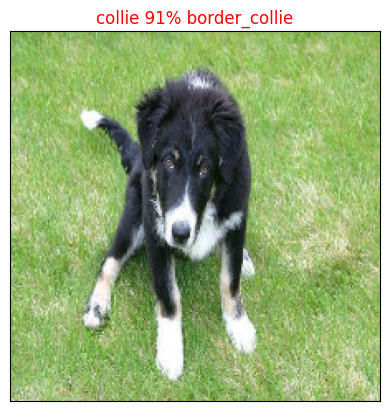

In [57]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=9)

Now we've got on function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [58]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

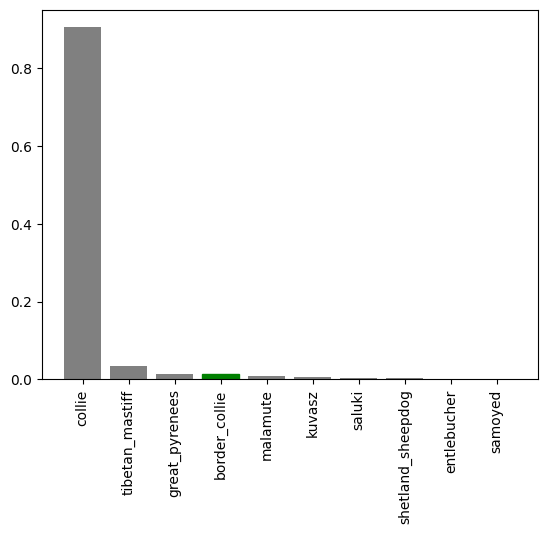

In [59]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few

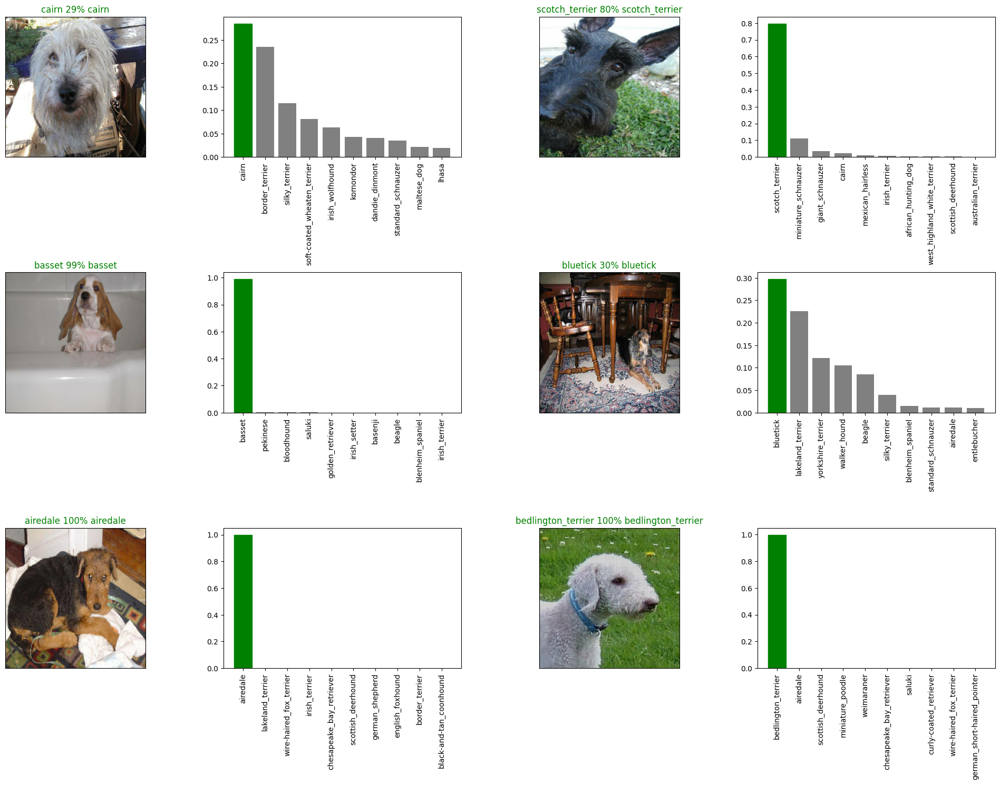

In [60]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [61]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model dir. and appends a suffix (string)
  """
  # Create a model dir. pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/model",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [67]:
# Create a function to load a saved model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [63]:
# Save model trained on 1000 images
save_model(model, suffix="1000-images-mobilnenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/model/20240220-15091708441782-1000-images-mobilnenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/model/20240220-15091708441782-1000-images-mobilnenetv2-Adam.h5'

In [68]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/model/20240220-15091708441782-1000-images-mobilnenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/model/20240220-15091708441782-1000-images-mobilnenetv2-Adam.h5


In [69]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 163ms/step - loss: 1.1041 - Accuracy: 0.7150


[1.1040865182876587, 0.7149999737739563]

In [70]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 4s 244ms/step - loss: 1.1041 - Accuracy: 0.7150


[1.1040865182876587, 0.7149999737739563]

## Training a big dog model (on the full data)

In [71]:
len(X), len(y)

(10222, 10222)

In [74]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [75]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [80]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set whan training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="Accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe for 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all the images into memory.

In [82]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0371 - Accuracy: 0.9964
Epoch 2/100
320/320 [==============================] - 40s 123ms/step - loss: 0.0324 - Accuracy: 0.9971
Epoch 3/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0254 - Accuracy: 0.9978
Epoch 4/100
320/320 [==============================] - 57s 177ms/step - loss: 0.0229 - Accuracy: 0.9984


In [83]:
save_model(full_model, suffix="full_image-set-mobilenetv2_Adam")

Saving model to: drive/MyDrive/Dog Vision/model/20240220-15411708443700-full_image-set-mobilenetv2_Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/model/20240220-15411708443700-full_image-set-mobilenetv2_Adam.h5'

In [84]:
# Load the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/model/20240220-15411708443700-full_image-set-mobilenetv2_Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/model/20240220-15411708443700-full_image-set-mobilenetv2_Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we crearet `create_data_batches()` earilier which can take a list of filenames as input and convert them into tensor batches.

To make predicrtions on the test data, ew'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [87]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e519e383a6efec0abd285beda04aeac9.jpg',
 'drive/MyDrive/Dog Vision/test/dd3eb4338145e614d325a917a35e5a1e.jpg',
 'drive/MyDrive/Dog Vision/test/e4607de37fdda1509487e042b6ca309a.jpg',
 'drive/MyDrive/Dog Vision/test/e6da14858db7781843db6af91551f627.jpg',
 'drive/MyDrive/Dog Vision/test/deec3d206b0f5c927c86ed1782990961.jpg',
 'drive/MyDrive/Dog Vision/test/e000b7b3b37659a771d0151dc453bc0a.jpg',
 'drive/MyDrive/Dog Vision/test/e145bbebb9ad1e740256e460899a6b67.jpg',
 'drive/MyDrive/Dog Vision/test/e7b357150635c250757363718e4dae86.jpg',
 'drive/MyDrive/Dog Vision/test/e2caef2df1087702936298aaac7843a1.jpg',
 'drive/MyDrive/Dog Vision/test/dca9642123204fd3df080147b05e4af3.jpg']

In [88]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

creating test data batches...


In [89]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about 1 h)

In [92]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1096s 3s/step


### Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pd DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a csv to submit it to Kaggle.

In [94]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [101]:
# Append test image id's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [102]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e519e383a6efec0abd285beda04aeac9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd3eb4338145e614d325a917a35e5a1e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e4607de37fdda1509487e042b6ca309a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6da14858db7781843db6af91551f627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,deec3d206b0f5c927c86ed1782990961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [104]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e519e383a6efec0abd285beda04aeac9,2.818080e-04,5.624075e-07,6.588353e-09,2.064277e-07,1.456497e-06,5.132742e-07,4.465230e-09,6.678041e-09,8.886105e-08,...,1.400732e-08,3.380937e-09,7.121856e-04,7.393666e-07,1.307821e-07,1.995294e-10,6.527451e-09,7.474231e-07,4.510615e-09,3.945650e-09
1,dd3eb4338145e614d325a917a35e5a1e,1.798944e-06,1.737552e-10,8.115221e-07,4.457299e-11,9.806933e-09,5.030235e-08,3.073751e-06,1.605203e-06,1.803928e-09,...,2.325293e-06,2.439280e-03,7.153623e-11,1.411324e-07,3.576083e-09,2.473436e-09,7.295281e-01,1.808197e-07,1.339391e-04,1.304081e-04
2,e4607de37fdda1509487e042b6ca309a,2.729013e-09,1.525522e-08,1.909738e-09,2.870301e-07,9.000017e-06,5.669874e-07,8.325928e-09,1.498748e-09,1.874431e-08,...,2.179093e-06,2.748935e-07,8.494651e-06,1.302192e-07,9.997140e-01,5.457889e-10,4.065182e-07,1.330045e-07,2.129400e-08,2.762080e-07
3,e6da14858db7781843db6af91551f627,4.634957e-05,1.110665e-05,3.501031e-06,2.655750e-07,1.391691e-08,1.273157e-09,4.897293e-09,2.603335e-09,8.769758e-12,...,1.075397e-08,3.686311e-10,7.546272e-09,2.995597e-07,2.093100e-08,4.453033e-10,7.173769e-08,8.200104e-06,6.063126e-09,5.013094e-07
4,deec3d206b0f5c927c86ed1782990961,1.370677e-10,8.869699e-11,3.512265e-10,5.782496e-08,1.155297e-06,1.017292e-06,1.093135e-09,6.252038e-11,1.714198e-10,...,5.789741e-10,3.718943e-10,2.382106e-08,1.904295e-08,4.233957e-11,9.445712e-10,6.541132e-10,7.229651e-10,1.154032e-11,5.968178e-09


In [105]:
# Save our predictions dataframe to csv for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv", index=False)

## Making predictions on our custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the file filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities into predictions labels
* Compare the predicted labels to the custom images

In [107]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [108]:
custom_image_path

['drive/MyDrive/Dog Vision/my-dog-photos/IMG_3729.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG_4543.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG_6496.jpeg']

In [109]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data


creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [110]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [112]:
custom_preds.shape

(3, 120)

In [115]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['silky_terrier', 'west_highland_white_terrier', 'yorkshire_terrier']

In [116]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

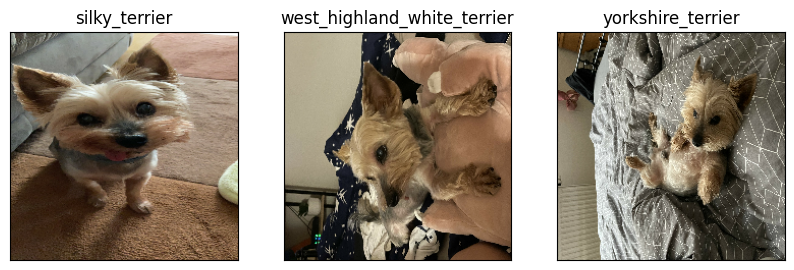

In [117]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)